https://ingo-janssen.de/aktienkurse-abfragen-mit-python-schritt-fuer-schritt/ prüfen für automatischen Import

# 1. Bibliothek laden

In [16]:
import pandas as pd
import os
import numpy as np
from dash import Dash, dcc, html, Input, Output, callback
from dash import Dash
from dash import dcc, html
from dash.dependencies import Input, Output
import dash_bootstrap_components as dbc
from dash import dash_table
import plotly.graph_objects as go
from datetime import datetime
from matplotlib import pyplot as plt
import plotly.express as px
import matplotlib as mpl
import locale
import matplotlib.ticker as mticker
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from kneed import KneeLocator

#Cheatsheets & Hilfe
#https://hackerthemes.com/bootstrap-cheatsheet/#mt-1
#Bootstrap Themes: https://bootswatch.com/flatly/

# 2. Daten laden & Measures einfügen

## Aktienkurse

In [17]:
folder_path = '.\Data_stocks'
data_frames = []

for file in os.listdir(folder_path):
    if file.endswith('.csv'):
        file_path = os.path.join(folder_path, file)
        data = pd.read_csv(file_path)
        filename = os.path.splitext(file)[0]  # Dateiname
        data['Stock/Index'] = filename  # Hinzufügen der Dateinamens-Spalte
        data_frames.append(data)

In [18]:
data_frames

[            Date          Open          High           Low         Close  \
 0     2018-09-25   6603.640137   6603.640137   6381.859863   6446.470215   
 1     2018-09-26   6452.790039   6585.910156   6397.890137   6495.000000   
 2     2018-09-27   6495.290039   6712.100098   6464.950195   6676.750000   
 3     2018-09-28   6678.750000   6785.029785   6598.319824   6644.129883   
 4     2018-09-29   6643.100098   6643.100098   6511.649902   6601.959961   
 ...          ...           ...           ...           ...           ...   
 1822  2023-09-21  27129.839844  27152.939453  26389.300781  26567.632813   
 1823  2023-09-22  26564.056641  26726.078125  26495.533203  26579.568359   
 1824  2023-09-23  26578.556641  26634.185547  26520.519531  26579.390625   
 1825  2023-09-24  26579.373047  26716.058594  26221.050781  26256.826172   
 1826  2023-09-25  26221.669922  26382.966797  26027.330078  26342.904297   
 
          Adj Close       Volume Stock/Index  
 0      6446.470215   47261

In [4]:
df_stocks = pd.concat(data_frames, ignore_index=True) # enthält die aggregierten Daten mit der zusätzlichen Information "Titel" in der letzten Spalte
df_stocks = df_stocks.fillna(0)
print(df_stocks)

             Date         Open         High          Low        Close  \
0      2018-09-25  6603.640137  6603.640137  6381.859863  6446.470215   
1      2018-09-26  6452.790039  6585.910156  6397.890137  6495.000000   
2      2018-09-27  6495.290039  6712.100098  6464.950195  6676.750000   
3      2018-09-28  6678.750000  6785.029785  6598.319824  6644.129883   
4      2018-09-29  6643.100098  6643.100098  6511.649902  6601.959961   
...           ...          ...          ...          ...          ...   
10553  2023-09-19  3123.989990  3131.129883  3113.530029  3124.959961   
10554  2023-09-20  3118.666992  3122.127930  3108.157959  3108.568115   
10555  2023-09-21  3103.175049  3113.493896  3084.700928  3084.700928   
10556  2023-09-22  3084.757080  3132.558105  3078.801025  3132.431885   
10557  2023-09-25  3131.208008  3131.208008  3112.150391  3115.607178   

         Adj Close        Volume                      Stock/Index  
0      6446.470215  4.726180e+09                       

In [5]:
df_stocks.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10558 entries, 0 to 10557
Data columns (total 8 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Date         10558 non-null  object 
 1   Open         10558 non-null  float64
 2   High         10558 non-null  float64
 3   Low          10558 non-null  float64
 4   Close        10558 non-null  float64
 5   Adj Close    10558 non-null  float64
 6   Volume       10558 non-null  float64
 7   Stock/Index  10558 non-null  object 
dtypes: float64(6), object(2)
memory usage: 660.0+ KB


In [6]:
# Datum formatieren und Infomationen hinzufügen
df_stocks['Date'] = pd.to_datetime(df_stocks['Date'], format='%Y-%m-%d')
df_stocks['Month'] = pd.to_datetime(df_stocks['Date']).dt.month
df_stocks['Year'] = pd.to_datetime(df_stocks['Date']).dt.year
df_stocks['MonthYear'] = df_stocks['Date'].dt.to_period('M')
df_stocks['Open'] = df_stocks['Open']
df_stocks['Close'] = df_stocks['Close']
df_stocks['High'] = df_stocks['High']
df_stocks['Low'] = df_stocks['Low']
df_stocks['Adj Close'] = df_stocks['Adj Close']
#df_stocks['Volume'] = df_stocks['Volume'].round().astype(int)

df_stocks

,Date,Open,High,Low,Close,Adj Close,Volume,Stock/Index,Month,Year,MonthYear
0,2018-09-25,6603.640137,6603.640137,6381.859863,6446.470215,6446.470215,4.726180e+09,BTC-USD,9,2018,2018-09
1,2018-09-26,6452.790039,6585.910156,6397.890137,6495.000000,6495.000000,4.437300e+09,BTC-USD,9,2018,2018-09
2,2018-09-27,6495.290039,6712.100098,6464.950195,6676.750000,6676.750000,4.606810e+09,BTC-USD,9,2018,2018-09
3,2018-09-28,6678.750000,6785.029785,6598.319824,6644.129883,6644.129883,5.014430e+09,BTC-USD,9,2018,2018-09
4,2018-09-29,6643.100098,6643.100098,6511.649902,6601.959961,6601.959961,4.363690e+09,BTC-USD,9,2018,2018-09
...,...,...,...,...,...,...,...,...,...,...,...
10553,2023-09-19,3123.989990,3131.129883,3113.530029,3124.959961,3124.959961,2.537000e+05,SSE Composite Index (000001.SS),9,2023,2023-09
10554,2023-09-20,3118.666992,3122.127930,3108.157959,3108.568115,3108.568115,2.281000e+05,SSE Composite Index (000001.SS),9,2023,2023-09
10555,2023-09-21,3103.175049,3113.493896,3084.700928,3084.700928,3084.700928,2.287000e+05,SSE Composite Index (000001.SS),9,2023,2023-09
10556,2023-09-22,3084.757080,3132.558105,3078.801025,3132.431885,3132.431885,2.860000e+05,SSE Composite Index (000001.SS),9,2023,2023-09


In [7]:
# neue Measures hinzufügen
df_stocks['Return'] = (df_stocks['Close'] - df_stocks['Open'])
df_stocks['Return %'] = ((df_stocks['Return'] / df_stocks['Open']) *100).round(1)
# Monatszahlen
df_stocks['Monthly Return'] = df_stocks.groupby(['Stock/Index', 'MonthYear'])['Return'].transform('sum')
df_stocks['Open Value Month'] = df_stocks.groupby(['Stock/Index', 'MonthYear'])['Open'].transform('first') # wird nur für die Kalkulation benötigt
df_stocks['Monthly Return %'] = ((df_stocks['Monthly Return'] / df_stocks['Open Value Month']) *100).round(1)
# Jahreszahlen
df_stocks['Yearly Return'] = df_stocks.groupby(['Stock/Index', 'Year'])['Return'].transform('sum')
df_stocks['Open Value Year'] = df_stocks.groupby(['Stock/Index', 'Year'])['Open'].transform('first') # wird nur für die Kalkulation benötigt
df_stocks['Yearly Return %'] = ((df_stocks['Yearly Return'] / df_stocks['Open Value Year']) *100).round(1)

df_stocks

,Date,Open,High,Low,Close,Adj Close,Volume,Stock/Index,Month,Year,MonthYear,Return,Return %,Monthly Return,Open Value Month,Monthly Return %,Yearly Return,Open Value Year,Yearly Return %
0,2018-09-25,6603.640137,6603.640137,6381.859863,6446.470215,6446.470215,4.726180e+09,BTC-USD,9,2018,2018-09,-157.169922,-2.4,11.589844,6603.640137,0.2,-2863.778316,6603.640137,-43.4
1,2018-09-26,6452.790039,6585.910156,6397.890137,6495.000000,6495.000000,4.437300e+09,BTC-USD,9,2018,2018-09,42.209961,0.7,11.589844,6603.640137,0.2,-2863.778316,6603.640137,-43.4
2,2018-09-27,6495.290039,6712.100098,6464.950195,6676.750000,6676.750000,4.606810e+09,BTC-USD,9,2018,2018-09,181.459961,2.8,11.589844,6603.640137,0.2,-2863.778316,6603.640137,-43.4
3,2018-09-28,6678.750000,6785.029785,6598.319824,6644.129883,6644.129883,5.014430e+09,BTC-USD,9,2018,2018-09,-34.620117,-0.5,11.589844,6603.640137,0.2,-2863.778316,6603.640137,-43.4
4,2018-09-29,6643.100098,6643.100098,6511.649902,6601.959961,6601.959961,4.363690e+09,BTC-USD,9,2018,2018-09,-41.140137,-0.6,11.589844,6603.640137,0.2,-2863.778316,6603.640137,-43.4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10553,2023-09-19,3123.989990,3131.129883,3113.530029,3124.959961,3124.959961,2.537000e+05,SSE Composite Index (000001.SS),9,2023,2023-09,0.969971,0.0,17.557130,3126.020020,0.6,49.794921,3087.510010,1.6
10554,2023-09-20,3118.666992,3122.127930,3108.157959,3108.568115,3108.568115,2.281000e+05,SSE Composite Index (000001.SS),9,2023,2023-09,-10.098877,-0.3,17.557130,3126.020020,0.6,49.794921,3087.510010,1.6
10555,2023-09-21,3103.175049,3113.493896,3084.700928,3084.700928,3084.700928,2.287000e+05,SSE Composite Index (000001.SS),9,2023,2023-09,-18.474121,-0.6,17.557130,3126.020020,0.6,49.794921,3087.510010,1.6
10556,2023-09-22,3084.757080,3132.558105,3078.801025,3132.431885,3132.431885,2.860000e+05,SSE Composite Index (000001.SS),9,2023,2023-09,47.674805,1.5,17.557130,3126.020020,0.6,49.794921,3087.510010,1.6


In [8]:
df_stocks.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10558 entries, 0 to 10557
Data columns (total 19 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   Date              10558 non-null  datetime64[ns]
 1   Open              10558 non-null  float64       
 2   High              10558 non-null  float64       
 3   Low               10558 non-null  float64       
 4   Close             10558 non-null  float64       
 5   Adj Close         10558 non-null  float64       
 6   Volume            10558 non-null  float64       
 7   Stock/Index       10558 non-null  object        
 8   Month             10558 non-null  int32         
 9   Year              10558 non-null  int32         
 10  MonthYear         10558 non-null  period[M]     
 11  Return            10558 non-null  float64       
 12  Return %          10553 non-null  float64       
 13  Monthly Return    10558 non-null  float64       
 14  Open Value Month  1055

## Covid

In [23]:
file_path = r'.\Data_Covid\owid-covid-data.csv'

df_covid = pd.read_csv(file_path, delimiter=',')
df_covid.head()

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,...,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,population,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million
0,AFG,Asia,Afghanistan,2020-01-03,NaN,0.0,NaN,NaN,0.0,NaN,...,NaN,37.746,0.5,64.83,0.511,41128772.0,NaN,NaN,NaN,NaN
1,AFG,Asia,Afghanistan,2020-01-04,NaN,0.0,NaN,NaN,0.0,NaN,...,NaN,37.746,0.5,64.83,0.511,41128772.0,NaN,NaN,NaN,NaN
2,AFG,Asia,Afghanistan,2020-01-05,NaN,0.0,NaN,NaN,0.0,NaN,...,NaN,37.746,0.5,64.83,0.511,41128772.0,NaN,NaN,NaN,NaN
3,AFG,Asia,Afghanistan,2020-01-06,NaN,0.0,NaN,NaN,0.0,NaN,...,NaN,37.746,0.5,64.83,0.511,41128772.0,NaN,NaN,NaN,NaN
4,AFG,Asia,Afghanistan,2020-01-07,NaN,0.0,NaN,NaN,0.0,NaN,...,NaN,37.746,0.5,64.83,0.511,41128772.0,NaN,NaN,NaN,NaN


In [24]:
df_covid

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,...,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,population,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million
0,AFG,Asia,Afghanistan,2020-01-03,NaN,0.0,NaN,NaN,0.0,NaN,...,NaN,37.746,0.5,64.83,0.511,41128772.0,NaN,NaN,NaN,NaN
1,AFG,Asia,Afghanistan,2020-01-04,NaN,0.0,NaN,NaN,0.0,NaN,...,NaN,37.746,0.5,64.83,0.511,41128772.0,NaN,NaN,NaN,NaN
2,AFG,Asia,Afghanistan,2020-01-05,NaN,0.0,NaN,NaN,0.0,NaN,...,NaN,37.746,0.5,64.83,0.511,41128772.0,NaN,NaN,NaN,NaN
3,AFG,Asia,Afghanistan,2020-01-06,NaN,0.0,NaN,NaN,0.0,NaN,...,NaN,37.746,0.5,64.83,0.511,41128772.0,NaN,NaN,NaN,NaN
4,AFG,Asia,Afghanistan,2020-01-07,NaN,0.0,NaN,NaN,0.0,NaN,...,NaN,37.746,0.5,64.83,0.511,41128772.0,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
344793,ZWE,Africa,Zimbabwe,2023-09-23,265748.0,0.0,0.0,5718.0,0.0,0.0,...,30.7,36.791,1.7,61.49,0.571,16320539.0,NaN,NaN,NaN,NaN
344794,ZWE,Africa,Zimbabwe,2023-09-24,265748.0,0.0,0.0,5718.0,0.0,0.0,...,30.7,36.791,1.7,61.49,0.571,16320539.0,NaN,NaN,NaN,NaN
344795,ZWE,Africa,Zimbabwe,2023-09-25,265748.0,0.0,0.0,5718.0,0.0,0.0,...,30.7,36.791,1.7,61.49,0.571,16320539.0,NaN,NaN,NaN,NaN
344796,ZWE,Africa,Zimbabwe,2023-09-26,265748.0,0.0,0.0,5718.0,0.0,0.0,...,30.7,36.791,1.7,61.49,0.571,16320539.0,NaN,NaN,NaN,NaN


In [25]:
# nicht benötigte Spalten löschen
columns_to_keep = ['iso_code', 'continent', 'location', 'date', 'new_cases']
df_covid.drop(df_covid.columns.difference(columns_to_keep), axis=1, inplace=True)
df_covid.head()

,iso_code,continent,location,date,new_cases
0,AFG,Asia,Afghanistan,2020-01-03,0.0
1,AFG,Asia,Afghanistan,2020-01-04,0.0
2,AFG,Asia,Afghanistan,2020-01-05,0.0
3,AFG,Asia,Afghanistan,2020-01-06,0.0
4,AFG,Asia,Afghanistan,2020-01-07,0.0


In [26]:
# Spalten umbenennen
df_covid.columns = df_covid.columns.str.replace('iso_code', 'Country short')
df_covid.columns = df_covid.columns.str.replace('continent', 'Continent')
df_covid.columns = df_covid.columns.str.replace('location', 'Country')
df_covid.columns = df_covid.columns.str.replace('date', 'Date')
df_covid.columns = df_covid.columns.str.replace('new_cases', 'New Cases')

# Datum formatieren & leere ersetzen
df_covid['Date'] = pd.to_datetime(df_covid['Date'], format='%Y-%m-%d')
df_covid = df_covid.fillna(0)

df_covid.head()

,Country short,Continent,Country,Date,New Cases
0,AFG,Asia,Afghanistan,2020-01-03,0.0
1,AFG,Asia,Afghanistan,2020-01-04,0.0
2,AFG,Asia,Afghanistan,2020-01-05,0.0
3,AFG,Asia,Afghanistan,2020-01-06,0.0
4,AFG,Asia,Afghanistan,2020-01-07,0.0


In [28]:
df_covid

,Country short,Continent,Country,Date,New Cases
0,AFG,Asia,Afghanistan,2020-01-03,0.0
1,AFG,Asia,Afghanistan,2020-01-04,0.0
2,AFG,Asia,Afghanistan,2020-01-05,0.0
3,AFG,Asia,Afghanistan,2020-01-06,0.0
4,AFG,Asia,Afghanistan,2020-01-07,0.0
...,...,...,...,...,...
344793,ZWE,Africa,Zimbabwe,2023-09-23,0.0
344794,ZWE,Africa,Zimbabwe,2023-09-24,0.0
344795,ZWE,Africa,Zimbabwe,2023-09-25,0.0
344796,ZWE,Africa,Zimbabwe,2023-09-26,0.0


In [27]:
df_covid.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 344798 entries, 0 to 344797
Data columns (total 5 columns):
 #   Column         Non-Null Count   Dtype         
---  ------         --------------   -----         
 0   Country short  344798 non-null  object        
 1   Continent      344798 non-null  object        
 2   Country        344798 non-null  object        
 3   Date           344798 non-null  datetime64[ns]
 4   New Cases      344798 non-null  float64       
dtypes: datetime64[ns](1), float64(1), object(3)
memory usage: 13.2+ MB


# 3. Diagramme

In [15]:
def heatmap():
    # Kennzahlen erstellen
    df_heatmap = df_stocks.pivot(index='Stock/Index', columns='Date', values='Return %')

    # Heatmap erstellen
    fig = px.imshow(df_heatmap,
                    labels=dict(x='Date', y='Stock/Index', color='Return %'),
                    x=df_heatmap.columns,
                    y=df_heatmap.index,
                    color_continuous_scale='RdYlGn',
                    color_continuous_midpoint=0,
                    zmin=-5,
                    zmax=5,
                    )

    # Layout
    fig.update_layout(
        title='Return % Heatmap for Stocks/Indices',
        width=800,
        xaxis_title='Date',
        xaxis=dict(rangeslider_visible=True,showspikes=True, spikethickness=2),
        yaxis_title='Stock/Index',
        coloraxis_colorbar=dict(thicknessmode="pixels", thickness=20, lenmode="pixels", len=250, yanchor="top", y=1, dtick=2),
        autosize=True,
    )

    return fig

heatmap()

In [28]:
df_heatmap = df_stocks.pivot(index='Stock/Index', columns='Date', values='Return %')
df_heatmap

Date,2018-09-25,2018-09-26,2018-09-27,2018-09-28,2018-09-29,2018-09-30,2018-10-01,2018-10-02,2018-10-03,2018-10-04,...,2023-09-16,2023-09-17,2023-09-18,2023-09-19,2023-09-20,2023-09-21,2023-09-22,2023-09-23,2023-09-24,2023-09-25
Stock/Index,,,,,,,,,,,,,,,,,,,,,
BTC-USD,-2.4,0.7,2.8,-0.5,-0.6,0.3,-0.5,-0.6,-0.8,1.2,...,-0.1,-0.1,0.8,1.7,-0.3,-2.1,0.1,0.0,-1.2,0.5
CAC 40 (^FCHI),0.2,0.5,0.7,-0.4,NaN,NaN,0.2,-0.1,0.1,-1.1,...,NaN,NaN,-1.1,0.4,0.7,-0.5,0.4,NaN,NaN,NaN
DAX PERFORMANCE-INDEX (^GDAXI),0.3,-0.1,0.9,-1.1,NaN,NaN,0.6,0.5,NaN,-0.3,...,NaN,NaN,-0.8,-0.2,0.5,-0.5,0.5,NaN,NaN,NaN
HANG SENG INDEX (^HSI),NaN,0.8,-0.7,-0.3,NaN,NaN,NaN,-2.1,0.9,-1.5,...,NaN,NaN,-0.8,0.3,-0.3,-0.8,2.7,NaN,NaN,-1.8
NASDAQ Composite (^IXIC),0.1,-0.3,0.3,0.3,NaN,NaN,-0.7,-0.3,-0.1,-1.4,...,NaN,NaN,0.3,0.2,-1.8,-0.8,-0.6,NaN,NaN,NaN
Nikkei 225 (^N225),0.2,0.8,-0.6,0.2,NaN,NaN,0.3,-0.4,-0.4,-1.1,...,NaN,NaN,NaN,-0.2,-0.7,-0.9,0.7,NaN,NaN,0.5
Russell 2000 (^RUT),0.2,-1.0,-0.1,0.4,NaN,NaN,-1.5,-1.0,0.9,-1.4,...,NaN,NaN,-0.7,-0.4,-1.3,-0.7,-0.6,NaN,NaN,NaN
SSE Composite Index (000001.SS),0.2,0.8,-0.5,1.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,0.5,0.0,-0.3,-0.6,1.5,NaN,NaN,-0.5


In [66]:
def treemap():
    # Kennzahlen erstellen
    df_treemap = df_stocks.groupby('Stock/Index').agg(
        Open=('Open', 'first'),
        Close=('Close', 'last'),
        Volume=('Volume', 'sum')
    ).reset_index()

    df_treemap['Return'] = df_treemap['Close'] - df_treemap['Open']
    df_treemap['Return %'] = ((df_treemap['Return'] / df_treemap['Open']) * 100).round(1)

    # Treemap erstellen
    fig = px.treemap(df_treemap,
                     path=['Stock/Index'],
                     values='Return',
                     color='Return %',
                     color_continuous_scale='RdYlGn',
                     color_continuous_midpoint=0,
                     title='Treemap: Return  by Stock/Index')

    # Layout
    fig.update_layout(
        margin = dict(t=50, l=25, r=25, b=25),
        font=dict(size=14, color='lightgray'),
    )

    fig.update_coloraxes(showscale=False) # Farbskala ausblenden

    # Texte
    return_text = ('Return: ' +df_treemap['Return'].round().apply(lambda x: '{:,.0f}'.format(x)).astype(str) + '\n(' + df_treemap['Return %'].astype(str) + '%)')
    fig.update_traces(text=return_text, selector=dict(type='treemap'), textposition='middle center', insidetextfont=dict(size=20))

    return fig

treemap()

In [31]:
df_treemap = df_stocks.groupby('Stock/Index').agg(
        Open=('Open', 'first'),
        Close=('Close', 'last'),
        Volume=('Volume', 'sum')
        ).reset_index()

df_treemap['Return'] = df_treemap['Close'] - df_treemap['Open']
df_treemap['Return %'] = (df_treemap['Return'] / df_treemap['Open']) * 100

df_treemap

,Stock/Index,Open,Close,Volume,Return,Return %
0,BTC-USD,6603.640137,26342.904297,-3923452624896,19739.264160,298.914898
1,CAC 40 (^FCHI),5468.910156,7184.819824,101741102500,1715.909668,31.375715
2,DAX PERFORMANCE-INDEX (^GDAXI),12341.849609,15557.290039,102949602400,3215.440430,26.053149
3,HANG SENG INDEX (^HSI),27606.810547,17729.289063,164444735140,-9877.521484,-35.779292
4,NASDAQ Composite (^IXIC),8001.589844,13211.809570,-2104144832928,5210.219726,65.114806
5,Nikkei 225 (^N225),23881.849609,32678.619141,89651700000,8796.769532,36.834540
6,Russell 2000 (^RUT),1705.489990,1776.500000,-2669927356352,71.010010,4.163613
7,SSE Composite Index (000001.SS),2775.065918,3115.607178,388836124,340.541260,12.271466


In [32]:
def candle_chart():
    # Kennzahlen erstellen
    df_candle_chart_stocks = df_stocks[df_stocks['Stock/Index'] == 'BTC-USD'] #Filter anpassen
    df_candle_chart_covid = df_covid[df_covid['Country'] == 'Switzerland']

    #Candle-Chart erstellen
    fig = go.Figure(data=[go.Candlestick(x=df_candle_chart_stocks['Date'],
                    open=df_candle_chart_stocks['Open'],
                    high=df_candle_chart_stocks['High'],
                    low=df_candle_chart_stocks['Low'],
                    close=df_candle_chart_stocks['Close'])])

    fig.update_layout(title='Daily Candlestick Chart',
                      xaxis_title='Date',
                      yaxis_title='Stock Price',
                      xaxis_rangeslider_visible=True)

    return fig
candle_chart()

In [33]:
df_candle_chart_covid = df_covid[df_covid['Country'] == 'Switzerland']
df_candle_chart_covid

,Country short,Continent,Country,Date,Cases Acc.,Cases
297233,CHE,Europe,Switzerland,2020-01-03,0.0,0.0
297234,CHE,Europe,Switzerland,2020-01-04,0.0,0.0
297235,CHE,Europe,Switzerland,2020-01-05,0.0,0.0
297236,CHE,Europe,Switzerland,2020-01-06,0.0,0.0
297237,CHE,Europe,Switzerland,2020-01-07,0.0,0.0
...,...,...,...,...,...,...
298592,CHE,Europe,Switzerland,2023-09-23,4412555.0,0.0
298593,CHE,Europe,Switzerland,2023-09-24,4412555.0,0.0
298594,CHE,Europe,Switzerland,2023-09-25,4412555.0,0.0
298595,CHE,Europe,Switzerland,2023-09-26,4412555.0,0.0


In [34]:
def candle_chart():
    # Kennzahlen erstellen
    df_candle_chart_stocks = df_stocks[df_stocks['Stock/Index'] == 'BTC-USD']  # Filter anpassen
    df_candle_chart_covid = df_covid[df_covid['Continent'] == 'Europe']  # Filter anpassen

    # Candle-Chart erstellen
    fig = go.Figure()
    candlestick = go.Candlestick(x=df_candle_chart_stocks['Date'],
                                 open=df_candle_chart_stocks['Open'],
                                 high=df_candle_chart_stocks['High'],
                                 low=df_candle_chart_stocks['Low'],
                                 close=df_candle_chart_stocks['Close'],
                                 name='Stock Price')
    fig.add_trace(candlestick)

    # Balkendiagramm für COVID-Cases hinzufügen
    bar_chart = go.Bar(x=df_candle_chart_covid['Date'],
                       y=df_candle_chart_covid['New Cases'],
                       name='COVID-19 Cases',
                       marker=dict(color='blue'),
                       yaxis='y2')  # yaxis='y2' platziert die Daten auf der Sekundärachse
    fig.add_trace(bar_chart)

    # Layout
    fig.update_layout(title_text='Stock Price and COVID-19 Cases',
                      xaxis_title='Date',
                      yaxis_title='Stock Price',
                      yaxis2=dict(title='COVID-19 Cases', overlaying='y', side='right'),
                      xaxis_rangeslider_visible=True,
                      legend=dict(x=0.4, y=1.15, orientation='h'))  # x und y bestimmen die Position der Legende

    return fig

candle_chart()

In [35]:
df_volatility  = df_stocks.groupby(['Stock/Index', 'Year'])['Return %'].std()
df_rendite  = df_stocks.groupby(['Stock/Index', 'Year'])['Return %'].mean()
df_scatter = pd.DataFrame({'Rendite %': df_rendite, 'Volatilität %': df_volatility}).reset_index()
df_scatter

,Stock/Index,Year,Rendite %,Volatilität %
0,BTC-USD,2018,-5.030612e-01,3.768629
1,BTC-USD,2019,2.490411e-01,3.560911
2,BTC-USD,2020,4.562842e-01,3.758483
3,BTC-USD,2021,1.917808e-01,4.216665
4,BTC-USD,2022,-2.232877e-01,3.325440
5,BTC-USD,2023,2.022388e-01,2.298476
6,CAC 40 (^FCHI),2018,-2.647059e-01,0.813095
7,CAC 40 (^FCHI),2019,8.862745e-02,0.702182
8,CAC 40 (^FCHI),2020,-4.513619e-02,1.325938
9,CAC 40 (^FCHI),2021,5.271318e-02,0.662160


<module 'matplotlib.pyplot' from 'D:\\Python\\Visual Analytics\\venv\\Lib\\site-packages\\matplotlib\\pyplot.py'>

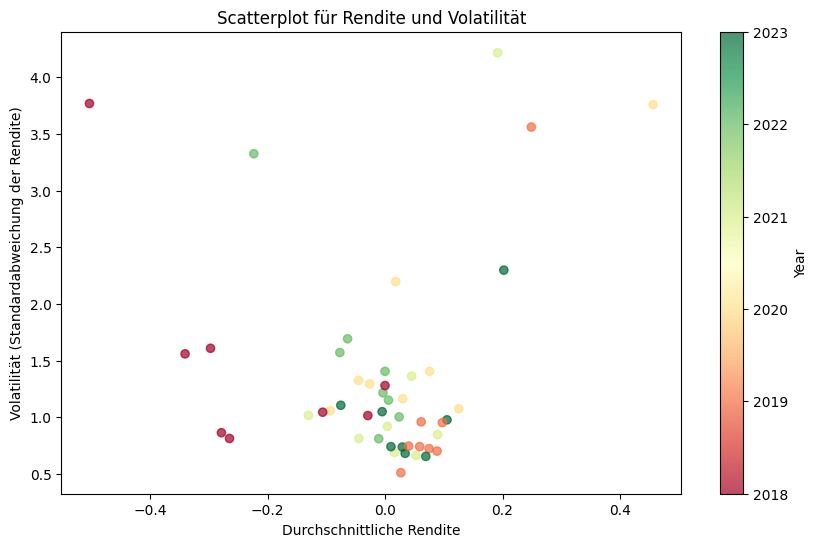

In [36]:
 def scatterplot():
    # Kennzahlen erstellen
    df_volatility  = df_stocks.groupby(['Stock/Index', 'Year'])['Return %'].std()
    df_rendite  = df_stocks.groupby(['Stock/Index', 'Year'])['Return %'].mean()
    df_scatter = pd.DataFrame({'Rendite %': df_rendite, 'Volatilität %': df_volatility}).reset_index()

    # Scatterplot erstellen
    plt.figure(figsize=(10, 6))
    scatter = plt.scatter(df_scatter['Rendite %'], df_scatter['Volatilität %'], c=df_scatter['Year'], cmap='RdYlGn', alpha=0.7)
    plt.title('Scatterplot für Rendite und Volatilität')
    plt.xlabel('Durchschnittliche Rendite')
    plt.ylabel('Volatilität (Standardabweichung der Rendite)')

    # Legende für die Farbskala
    legend = plt.colorbar(scatter, label='Year')

    return plt

scatterplot()

In [37]:
def table_stocks():
    # Kennzahlen erstellen
    df_table_stocks = df_stocks.groupby('Stock/Index').agg(
    Start=('Open', 'first'),
    End=('Close', 'last'),
    High=('High', 'max'),
    Low=('Low', 'min'),
    Volume=('Volume', 'sum'),
    ).reset_index()

    df_table_stocks['Return'] = df_table_stocks['End'] - df_table_stocks['Start']
    df_table_stocks['Return %'] = (df_table_stocks['Return'] / df_table_stocks['Start']) * 100

    # Table erstellen
    table_stocks = dash_table.DataTable(
                     id='table_stocks',
                        columns=[ {'name': 'Stock/Index', 'id': 'Stock/Index'},
                                    {'name': 'Start', 'id': 'Start'},
                                    {'name': 'End', 'id': 'End'},
                                    {'name': 'High', 'id': 'High', 'type': 'numeric', 'format': {'specifier': '.2f'}, 'presentation': 'positive'},
                                    {'name': 'Low', 'id': 'Low', 'type': 'numeric', 'format': {'specifier': '.2f'}, 'presentation': 'negative'},
                                    {'name': 'Volume', 'id': 'Volume'},
                                    {'name': 'Return', 'id': 'Return'},
                                    {'name': 'Return %', 'id': 'Return %', 'type': 'numeric', 'format': {'specifier': '.2f'}}
                                ],
                    data=df_table_stocks.to_dict('records'),
                    style_data_conditional=[
                        {'if': {'column_id': 'High'},
                         'backgroundColor': '#7FFF7F',
                        'color': 'black', },
                        {'if': {'column_id': 'Low'},
                         'backgroundColor': '#FF7F7F',
                         'color': 'black', },
                    ],
                )
    # Layout

table_stocks()

In [38]:
df_liste_stocks = df_stocks.groupby('Stock/Index').agg(
    Start=('Open', 'first'),
    End=('Close', 'last'),
    High=('High', 'max'),
    Low=('Low', 'min'),
    Volume=('Volume', 'sum'),
    ).reset_index()

df_liste_stocks['Return'] = df_liste_stocks['End'] - df_liste_stocks['Start']
df_liste_stocks['Return %'] = (df_liste_stocks['Return'] / df_liste_stocks['Start']) * 100

df_liste_stocks

,Stock/Index,Start,End,High,Low,Volume,Return,Return %
0,BTC-USD,6603.640137,26342.904297,68789.625000,3191.303467,-3923452624896,19739.264160,298.914898
1,CAC 40 (^FCHI),5468.910156,7184.819824,7581.259766,0.000000,101741102500,1715.909668,31.375715
2,DAX PERFORMANCE-INDEX (^GDAXI),12341.849609,15557.290039,16528.970703,8255.650391,102949602400,3215.440430,26.053149
3,HANG SENG INDEX (^HSI),27606.810547,17729.289063,31183.359375,14597.309570,164444735140,-9877.521484,-35.779292
4,NASDAQ Composite (^IXIC),8001.589844,13211.809570,16212.230469,6190.169922,-2104144832928,5210.219726,65.114806
5,Nikkei 225 (^N225),23881.849609,32678.619141,33772.890625,0.000000,89651700000,8796.769532,36.834540
6,Russell 2000 (^RUT),1705.489990,1776.500000,2458.860107,966.219971,-2669927356352,71.010010,4.163613
7,SSE Composite Index (000001.SS),2775.065918,3115.607178,3731.687012,2440.906982,388836124,340.541260,12.271466


In [39]:
def table_covid():
    # Kennzahlen erstellen
    df_covid.groupby('Continent').agg(
    Start_Acc=('Cases Acc.', 'first'),
    End_Acc=('Cases Acc.', 'last'),
    High=('Cases', 'max'),
    Low=('Cases', 'min'),
    ).reset_index()

    df_table_covid['New Cases'] = df_table_covid['End_Acc'] - df_table_covid['Start_Acc']

    # Table erstellen


NameError: name 'df_table_covid' is not defined

In [25]:
df_table_covid = df_covid.groupby('Country').agg(
    Start_Cases=('New Cases', 'first'),
    End_Cases=('New Cases', 'last'),
    Start_Acc=('New Cases', 'first'),
    End_Acc=('New Cases', 'sum'),
    High=('New Cases', 'max'),
    Low=('New Cases', 'min'),
    Cases=('New Cases', 'sum')
    ).reset_index()

df_table_covid

,Country,Start_Cases,End_Cases,Start_Acc,End_Acc,High,Low,Cases
0,Afghanistan,0.0,0.0,0.0,225983.0,3243.0,0.0,225983.0
1,Africa,0.0,0.0,0.0,13131727.0,72463.0,0.0,13131727.0
2,Albania,0.0,0.0,0.0,334090.0,2832.0,0.0,334090.0
3,Algeria,0.0,0.0,0.0,271852.0,2521.0,0.0,271852.0
4,American Samoa,0.0,0.0,0.0,8341.0,955.0,0.0,8341.0
...,...,...,...,...,...,...,...,...
250,Western Sahara,0.0,0.0,0.0,0.0,0.0,0.0,0.0
251,World,0.0,0.0,0.0,770955465.0,8401961.0,0.0,770955465.0
252,Yemen,0.0,0.0,0.0,11945.0,287.0,0.0,11945.0
253,Zambia,0.0,0.0,0.0,349287.0,5555.0,0.0,349287.0


ValueError: No axis named Country for object type DataFrame

## 4. Clustering

### Cluster Heatmap

In [40]:
# Kennzahlen erstellen
X = df_stocks.pivot(index='Stock/Index', columns='Date', values='Return %')

# NaN-Werte durch Nullen ersetzen
X = X.fillna(0)
X

Date,2018-09-25,2018-09-26,2018-09-27,2018-09-28,2018-09-29,2018-09-30,2018-10-01,2018-10-02,2018-10-03,2018-10-04,...,2023-09-16,2023-09-17,2023-09-18,2023-09-19,2023-09-20,2023-09-21,2023-09-22,2023-09-23,2023-09-24,2023-09-25
Stock/Index,,,,,,,,,,,,,,,,,,,,,
BTC-USD,-2.4,0.7,2.8,-0.5,-0.6,0.3,-0.5,-0.6,-0.8,1.2,...,-0.1,-0.1,0.8,1.7,-0.3,-2.1,0.1,0.0,-1.2,0.5
CAC 40 (^FCHI),0.2,0.5,0.7,-0.4,0.0,0.0,0.2,-0.1,0.1,-1.1,...,0.0,0.0,-1.1,0.4,0.7,-0.5,0.4,0.0,0.0,0.0
DAX PERFORMANCE-INDEX (^GDAXI),0.3,-0.1,0.9,-1.1,0.0,0.0,0.6,0.5,0.0,-0.3,...,0.0,0.0,-0.8,-0.2,0.5,-0.5,0.5,0.0,0.0,0.0
HANG SENG INDEX (^HSI),0.0,0.8,-0.7,-0.3,0.0,0.0,0.0,-2.1,0.9,-1.5,...,0.0,0.0,-0.8,0.3,-0.3,-0.8,2.7,0.0,0.0,-1.8
NASDAQ Composite (^IXIC),0.1,-0.3,0.3,0.3,0.0,0.0,-0.7,-0.3,-0.1,-1.4,...,0.0,0.0,0.3,0.2,-1.8,-0.8,-0.6,0.0,0.0,0.0
Nikkei 225 (^N225),0.2,0.8,-0.6,0.2,0.0,0.0,0.3,-0.4,-0.4,-1.1,...,0.0,0.0,0.0,-0.2,-0.7,-0.9,0.7,0.0,0.0,0.5
Russell 2000 (^RUT),0.2,-1.0,-0.1,0.4,0.0,0.0,-1.5,-1.0,0.9,-1.4,...,0.0,0.0,-0.7,-0.4,-1.3,-0.7,-0.6,0.0,0.0,0.0
SSE Composite Index (000001.SS),0.2,0.8,-0.5,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.5,0.0,-0.3,-0.6,1.5,0.0,0.0,-0.5


D:\Python\Visual Analytics\venv\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

D:\Python\Visual Analytics\venv\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

D:\Python\Visual Analytics\venv\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

D:\Python\Visual Analytics\venv\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

D:\Python\Visual Analytics\venv\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: F

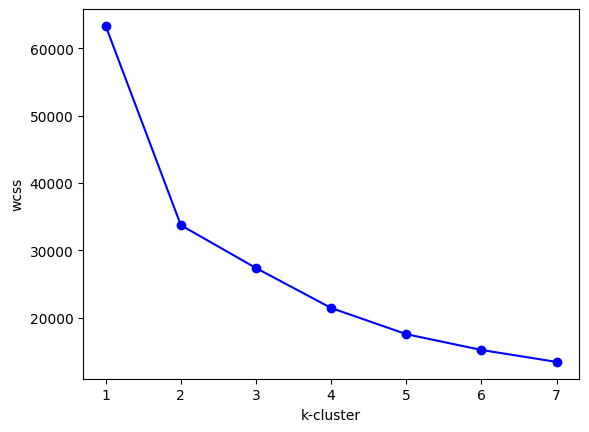

Optimale Anzahl der Cluster: 2


In [41]:
# Kennzahlen erstellen
df_heatmap_cluster = df_stocks[['Open', 'Close', 'High', 'Low', 'Return', 'Return %']]
df_heatmap_cluster = df_heatmap_cluster.fillna(0)

# Daten normalisieren
scaler = StandardScaler()
df_heatmap_cluster = scaler.fit_transform(df_heatmap_cluster)

wcss = []
for i in range(1, 8):
      kmeans = KMeans(n_clusters=i, random_state=0, n_init=10)
      kmeans.fit(df_heatmap_cluster) # Datensatz hier hinterlegen
      wcss.append(kmeans.inertia_)

#Visualisierung
x = np.linspace(1, 7, 7)
plt.xlabel(f'k-cluster')
plt.ylabel(f'wcss')
plt.plot (x, wcss, 'b-')
plt.plot (x, wcss, 'bo')
plt.show()

#n_clusters berechnen
kneedle = KneeLocator(range(1, 8), wcss, curve='convex', direction='decreasing')
optimal_k = kneedle.knee
print(f"Optimale Anzahl der Cluster: {optimal_k}")

In [42]:
kmeans = KMeans(n_clusters=5, random_state=0) # Anzahl der Cluster eintragen

df_stocks['Cluster'] = kmeans.fit_predict(df_heatmap_cluster)

# Kennzahlen erstellen
heatmap_data = df_stocks.pivot(index='Stock/Index', columns='Date', values='Cluster')

# Heatmap erstellen
fig = px.imshow(heatmap_data, color_continuous_scale='RdYlGn',)

# Layout
fig.update_layout(
    title='K-Means Clustering of Stock Prices',
    xaxis_title='Date',
    xaxis=dict(rangeslider_visible=True,showspikes=True, spikethickness=2),
    yaxis_title='Stock/Index',
)

fig.show()

D:\Python\Visual Analytics\venv\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



### Cluster Scatterplot

In [43]:
# Kennzahlen erstellen
df_volatility  = df_stocks.groupby(['Stock/Index', 'Year'])['Return %'].std()
df_rendite  = df_stocks.groupby(['Stock/Index', 'Year'])['Return %'].mean()
df_scatter  = pd.DataFrame({'Rendite %': df_rendite, 'Volatilität %': df_volatility}).reset_index()
df_scatter = df_scatter [['Rendite %', 'Volatilität %']]

# Daten normalisieren
scaler = StandardScaler()
df_scatter_cluster = scaler.fit_transform(df_scatter)

wcss = []
for i in range(1, 10):
      kmeans = KMeans(n_clusters=i, random_state=0)
      kmeans.fit(df_scatter_cluster) # Datensatz hier hinterlegen
      wcss.append(kmeans.inertia_)

# Plot für Elbow Method erstellen
#plt.plot(range(1, 10), wcss, marker='o')
#plt.title('Elbow Method')
#plt.xlabel('Anzahl der Cluster')
#plt.ylabel('Within-Cluster-Sum-of-Squares (WCSS)')
#plt.show()

#n_clusters berechnen
kneedle = KneeLocator(range(1, 10), wcss, curve='convex', direction='decreasing')
optimal_k = kneedle.knee
#print(f"Optimale Anzahl der Cluster: {optimal_k}")

D:\Python\Visual Analytics\venv\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

D:\Python\Visual Analytics\venv\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

D:\Python\Visual Analytics\venv\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

D:\Python\Visual Analytics\venv\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

D:\Python\Visual Analytics\venv\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: F

In [44]:
kmeans_model = KMeans(n_clusters=3, random_state=0)
df_scatter['Cluster'] = kmeans_model.fit_predict(df_scatter_cluster)
df_scatter

D:\Python\Visual Analytics\venv\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



,Rendite %,Volatilität %,Cluster
0,-5.030612e-01,3.768629,2
1,2.490411e-01,3.560911,1
2,4.562842e-01,3.758483,1
3,1.917808e-01,4.216665,1
4,-2.232877e-01,3.325440,2
5,2.022388e-01,2.298476,1
6,-2.647059e-01,0.813095,2
7,8.862745e-02,0.702182,0
8,-4.513619e-02,1.325938,0
9,5.271318e-02,0.662160,0


In [45]:
def scatterplot_cluster():
    fig = px.scatter(df_scatter, x='Rendite %', y='Volatilität %', color='Cluster',
                     color_continuous_scale='viridis',
                     title='Scatterplot für Rendite und Volatilität mit Clustering',
                     labels={'Rendite %': 'Durchschnittliche Rendite %', 'Volatilität %': 'Volatilität %'},
                     )

    fig.update_layout(
        showlegend=True,
        legend=dict(title='Cluster', yanchor='top', y=0.99, xanchor='left', x=0.01),
        coloraxis_colorbar=dict(title='Cluster'),
    )

    fig.show()

scatterplot_cluster()

## 5. Trendanalyse

In [14]:
def candle_chart_trend():
    # Kennzahlen erstellen
    df_candle_chart_stocks = df_stocks[df_stocks['Stock/Index'] == 'BTC-USD']  # Filter löschen im Dashboard
    df_candle_chart_covid = df_covid[df_covid['Continent'] == 'Europe']  # Filter anpassen

    # 20-Tage gleitenden Durchschnitt berechnen
    df_candle_chart_stocks['20_MA'] = df_candle_chart_stocks['Close'].rolling(window=20).mean()

    # Candle-Chart erstellen
    fig = go.Figure()

    # Candlestick
    candlestick = go.Candlestick(x=df_candle_chart_stocks['Date'],
                                 open=df_candle_chart_stocks['Open'],
                                 high=df_candle_chart_stocks['High'],
                                 low=df_candle_chart_stocks['Low'],
                                 close=df_candle_chart_stocks['Close'],
                                 name='Stock Price')
    fig.add_trace(candlestick)

    # 20-Tage gleitenden Durchschnitt hinzufügen
    moving_avg = go.Scatter(x=df_candle_chart_stocks['Date'],
                            y=df_candle_chart_stocks['20_MA'],
                            mode='lines',
                            name='20-Day Moving Average',
                            line=dict(color='orange'))
    fig.add_trace(moving_avg)

    # Balkendiagramm für COVID-Cases hinzufügen
    bar_chart = go.Bar(x=df_candle_chart_covid['Date'],
                       y=df_candle_chart_covid['New Cases'],
                       name='COVID-19 Cases',
                       marker=dict(color='blue'),
                       yaxis='y2')  # yaxis='y2' platziert die Daten auf der Sekundärachse
    fig.add_trace(bar_chart)

    # Layout
    fig.update_layout(title_text='Stock Price with 20-Day Moving Average',
                      xaxis_title='Date',
                      yaxis_title='Stock Price',
                      xaxis_rangeslider_visible=True,
                      yaxis2=dict(title='COVID-19 Cases', overlaying='y', side='right'),
                      legend=dict(x=0.4, y=1.15, orientation='h'))  # Position der Legende

    return fig

candle_chart_trend()

C:\Users\michi\AppData\Local\Temp\ipykernel_13316\640099916.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



# Testing yfinance

In [33]:
import yfinance as yf
import pandas as pd

# Aktiensymbole definieren und extrahieren
aktien_symbole = ["SMSN.IL"] # einzelne Titel testen, ob sie passen
#aktien_symbole = ["BTC-USD", "^FCHI", "^GDAXI", "^HSI", "^IXIC", "^N225", "^RUT", "000001.SS", "AAPL", "MSFT", "FB", "TSLA", "UBS", "NSRGY", "NVS", "DB", "HSBC", "LOGI", "EA", "VWAGY", "RNLSY", "UBSFY" ] # finale Liste der Titel (eine Auswahl zumindest)

data_frames = []
for aktien_symbol in aktien_symbole:
    aktien_daten = yf.download(aktien_symbol, start="2010-01-01")
    data_frames.append(aktien_daten)

# DataFrame für Aktiendaten erstellen
df_stocks_yfinance = pd.concat(data_frames, keys=aktien_symbole, names=['Stock/Index', 'Date'])
df_stocks_yfinance

[*********************100%%**********************]  1 of 1 completed


Open         High          Low        Close  \
Stock/Index Date                                                             
SMSN.IL     2010-01-04   332.700012   332.700012   332.700012   332.700012   
            2010-01-05   332.700012   332.700012   332.700012   332.700012   
            2010-01-06   332.700012   332.700012   332.700012   332.700012   
            2010-01-07   332.700012   332.700012   332.700012   332.700012   
            2010-01-08   332.700012   332.700012   332.700012   332.700012   
...                             ...          ...          ...          ...   
            2023-12-18  1395.000000  1399.000000  1381.000000  1384.000000   
            2023-12-19  1391.000000  1406.000000  1388.000000  1404.000000   
            2023-12-20  1430.000000  1439.000000  1422.000000  1436.000000   
            2023-12-21  1430.000000  1446.000000  1430.000000  1440.000000   
            2023-12-22  1450.000000  1455.000000  1447.000000  1453.000000   

                          Adj Close  Volume  
Stock/Index Date                             
SMSN.IL     2010-01-04   253.445267       0  
            2010-01-05   253.445267       0  
            2010-01-06   253.445267       0  
            2010-01-07   253.445267       0  
            2010-01-08   253.445267       0  
...                             ...     ...  
            2023-12-18  1384.000000   14075  
            2023-12-19  1404.000000   14376  
            2023-12-20  1436.000000   12606  
            2023-12-21  1440.000000   11061  
            2023-12-22  1453.000000    5609  

[3531 rows x 6 columns]